# US Land Border Crossings

I first worked with geodata in Georgia Tech's Computing for Data Analysis course this spring (2021). I was fascinated with the geopandas library and knew I wanted to dig deeper into working with maps and geo-based data analysis! This project also presented a natural opportunity for me to explore interactive plots in Python with hvplot and bokeh.

This notebook uses data from the US Bureau of Transportation Statistics (https://www.bts.gov/browse-statistical-products-and-data/border-crossing-data/border-crossingentry-data) on land border crossings into the US from Canada and Mexico from January 1996 - March 2021. 

### Questions to Explore:
- What are the most popular ports of entry into the US? Are they different for personal vehicles vs. trucks? How many people and vehicles cross the border each month?
- What general trends can we observe in border crossings? Are they similar for the US-Mexico and US-Canada border? Are there seasonal patterns?
- Have truck and passenger border crossings data changed since the Covid-19 pandemic? If so, where and how?

### Data sources:
1. Border crossing data by port https://data.bts.gov/Research-and-Statistics/Border-Crossing-Entry-Data/keg4-3bc2/data, definintions at https://www.bts.gov/browse-statistical-products-and-data/statistical-products/border-crossingdata-entry-coverage
2. Geodata: US ports https://hifld-geoplatform.opendata.arcgis.com/datasets/canada-and-mexico-border-crossings/explore?location=31.988241%2C-57.821913%2C2.98&showTable=true
3. Geodata: US map https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.html

### Tools Used:
- Basic data manipulation and visualization: Python, pandas, matplotlib, seaborn
- Geodata: geopandas
- Interactive visualization: bokeh, hvplot

## Setup

Let's start by loading the libraries and data:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
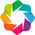

In [304]:
# Import libraries
import pandas as pd
import numpy as np
from datetime import datetime
import geopandas
from matplotlib import pyplot as plt
import seaborn as sns
import hvplot.pandas
import holoviews as hv
import bokeh
hv.extension('bokeh', 'matplotlib')
from bokeh.models import HoverTool
from bokeh.plotting import figure
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [305]:
# Set plotting parameters
plt.rcParams['figure.figsize'] = (15,8)
sns.set_style("dark")

In [306]:
# Load border dataset
border = pd.read_csv('Border_Crossing_Entry_Data.csv')
print(f"There are {border.shape[0]} rows of data and {border['Port Name'].nunique()} different ports.")
border.head()

There are 364510 rows of data and 117 different ports.


,Port Name,State,Port Code,Border,Date,Measure,Value
0,Alcan,Alaska,3104,US-Canada Border,01/01/2021 12:00:00 AM,Personal Vehicle Passengers,690
1,Alcan,Alaska,3104,US-Canada Border,01/01/2021 12:00:00 AM,Personal Vehicles,444
2,Alcan,Alaska,3104,US-Canada Border,01/01/2021 12:00:00 AM,Truck Containers Empty,350
3,Alcan,Alaska,3104,US-Canada Border,01/01/2021 12:00:00 AM,Truck Containers Loaded,51
4,Alcan,Alaska,3104,US-Canada Border,01/01/2021 12:00:00 AM,Trucks,416


In [307]:
# Clean border data - convert `Date` and `Value` column so they're easier to work with
border['Date'] = pd.to_datetime(border['Date'])
border['Value'] = border['Value'].str.replace(',', '').astype(int)

In [308]:
# Load ports dataset and select relevant columns
ports = geopandas.read_file('Canada_and_Mexico_Border_Crossings.shp')
ports = ports[['objectid', 'portcode', 'portname', 'state', 'cp_name', 'uniqueid', 'stfips', 'geometry']]
ports['portcode'] = ports['portcode'].astype(int)
print(f'This is a {type(ports)}')
display(ports.head())

This is a <class 'geopandas.geodataframe.GeoDataFrame'>


,objectid,portcode,portname,state,cp_name,uniqueid,stfips,geometry
0,1,3803,Sault Ste. Marie,MI,Sault Ste. Marie,3803,26,POINT (-9390992.926 5862204.472)
1,2,3802,Port Huron,MI,Port Huron,3802,26,POINT (-9175352.833 5311746.296)
2,3,3801,Detroit-Ambassador Bridge,MI,Detroit,3804,26,POINT (-9247761.733 5207803.188)
3,4,901,Niagara Falls-Lewiston Bridge,NY,Buffalo-Niagara Falls,0904,36,POINT (-8799189.192 5335297.102)
4,5,901,Niagara Falls-Whirlpool Bridge,NY,Buffalo-Niagara Falls,0903,36,POINT (-8800733.991 5328613.455)


We'll use geopandas to work with this GeoDataFrame. Note the geometry column, where the geodata is stored.

In [309]:
# Load USA geodata
usa = geopandas.read_file('us_map.json')
usa.head()

,GEO_ID,STATE,NAME,LSAD,CENSUSAREA,geometry
0,0400000US01,01,Alabama,,50645.326,"MULTIPOLYGON (((-88.12466 30.28364, -88.08681 ..."
1,0400000US02,02,Alaska,,570640.950,"MULTIPOLYGON (((-166.10574 53.98861, -166.0752..."
2,0400000US04,04,Arizona,,113594.084,"POLYGON ((-112.53859 37.00067, -112.53454 37.0..."
3,0400000US05,05,Arkansas,,52035.477,"POLYGON ((-94.04296 33.01922, -94.04304 33.079..."
4,0400000US06,06,California,,155779.220,"MULTIPOLYGON (((-122.42144 37.86997, -122.4213..."


Geodata can be stored in several different CRS (coordinate reference systems) - think latitude/longitude or Mercator. For more info, you can check out the geopandas documentation (https://geopandas.org/docs/user_guide/projections.html) or https://jcutrer.com/python/learn-geopandas-plotting-usmaps. Our two geodata files are stored in different formats, so we'll need to project them both into the same format - EPSG:3395 Spherical Mercator. 

In [310]:
# CRS of ports geodata
ports.crs

<Projected CRS: EPSG:3857>
Name: WGS 84 / Pseudo-Mercator
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: World between 85.06°S and 85.06°N.
- bounds: (-180.0, -85.06, 180.0, 85.06)
Coordinate Operation:
- name: Popular Visualisation Pseudo-Mercator
- method: Popular Visualisation Pseudo Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [311]:
# CRS of US map geodata
usa.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [312]:
# Convert US map and ports geodata to the same format
usa = usa.to_crs("EPSG:3395")
ports = ports.to_crs("EPSG:3395")

Now, we can plot the maps...

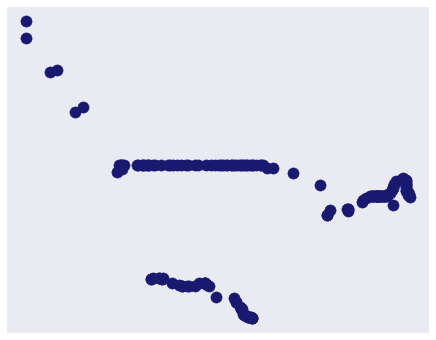

In [313]:
fig, ax = plt.subplots(figsize=(10,6))
ports.plot(color='midnightblue', ax=ax)
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False);

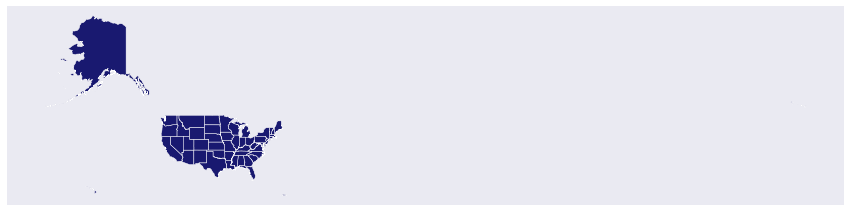

In [314]:
fig, ax = plt.subplots()
usa.plot(color='midnightblue', ax=ax)
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False);

Pretty neat!

## Where are the border crossings?

We'll stick to analyzing ports in the continental US for this notebook - sorry Alaska! We can use geopanda's total_bounds to set the map boundaries accordingly:

In [315]:
xmin, ymin, xmax, ymax = usa[usa['NAME'].isin(['Alaska', 'Hawaii', 'Puerto Rico', 'Guam'])==False].total_bounds
print(f'Map bounds: xmin {xmin}, xmax {xmax}, ymin {ymin}, ymax {ymax}')

Map bounds: xmin -13885233.414708791, xmax -7452828.220063132, ymin 2802180.5936591686, ymax 6307879.040906803


First, let's plot the ports. You can hover over each port to see its name:

In [316]:
# Create hover tool
hover = HoverTool(
    tooltips=[
        ("Port Name", "@portname")
    ])

# Use hvplot to plot an interactive map!
# Create US map plot
usa_plot = usa.hvplot(color='silver', line_color='white', xlim=(xmin-100000, xmax+100000), 
           ylim=(ymin-100000, ymax+100000), width=950, height=550) 

# Create ports plot
ports_plot = ports.hvplot(c='portname', cmap='Category20', legend=False, xaxis=None, yaxis=None, 
                          tools=[hover], marker='o', size=150, alpha=.8, line_color='black', title="Land Border Ports") 

# Plot US map and ports together:
usa_plot * ports_plot

:Overlay
   .Polygons.I :Polygons   [x,y]
   .Points.I   :Points   [x,y]   (portname)

## How many vehicles and passengers cross the border each month?

The dataset has counts for monthly crossings of different vehicle types:

In [317]:
# Modes of transportation
border['Measure'].unique().tolist()

['Personal Vehicle Passengers',
 'Personal Vehicles',
 'Truck Containers Empty',
 'Truck Containers Loaded',
 'Trucks',
 'Pedestrians',
 'Rail Containers Empty',
 'Rail Containers Loaded',
 'Train Passengers',
 'Trains',
 'Buses',
 'Bus Passengers']

We're interested in counting the total number of vehicles of each type, as well as the total number of people crossing the border at each port. Based on the documentation, we'll use the following measures:

In [318]:
VEHICLE_COUNTS = ['Personal Vehicles', 'Trucks', 
                  'Trains', 'Buses']
PERSON_COUNTS = ['Personal Vehicle Passengers', 'Pedestrians', 'Train Passengers', 'Bus Passengers']

Let's look at the total vehicle crossings per month, across all ports:

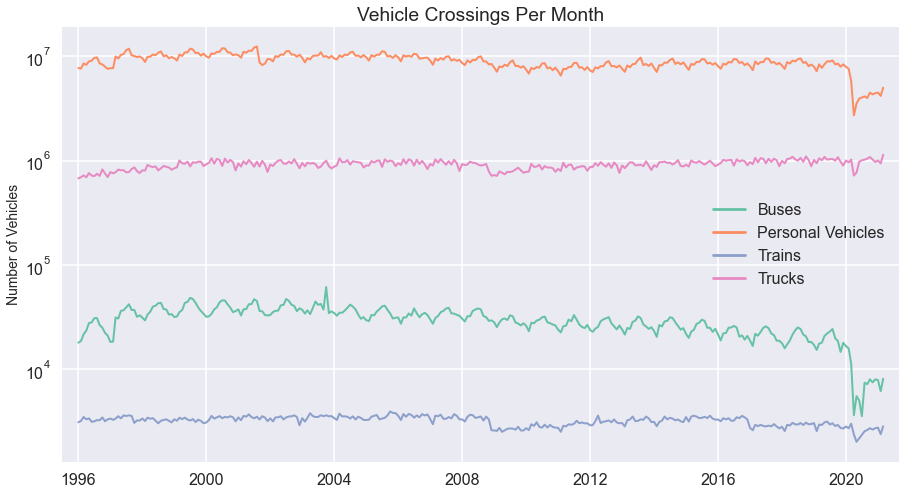

In [319]:
# Aggregate data by vehicle type and date
all_vehicles = border[border['Measure'].isin(VEHICLE_COUNTS)].groupby(['Measure', 'Date'], as_index=False)['Value'].sum()

# Plot 
sns.set_palette('Set2')
plt.style.use('seaborn-darkgrid')
fig, ax = plt.subplots()
g = sns.lineplot(data=all_vehicles, x='Date', y='Value', hue='Measure', linewidth=2, ax=ax)
ylabels = ['{:.0f}'.format(y) + 'M' for y in g.get_yticks()/1000000]
ax.set_yticklabels(ylabels)
ax.set_ylabel("Number of Vehicles", fontsize=14)
ax.set_xlabel("")
ax.set_title("Vehicle Crossings Per Month")
ax.set_yscale('log')
ax.margins(x=.02)
ax.legend(title='');

We can see that by far, personal vehicles are the most popular, with about 10 million crossings per month (until 2020). About 1 million trucks cross the border each month.

Let's zoom in closer on each mode of transportation:

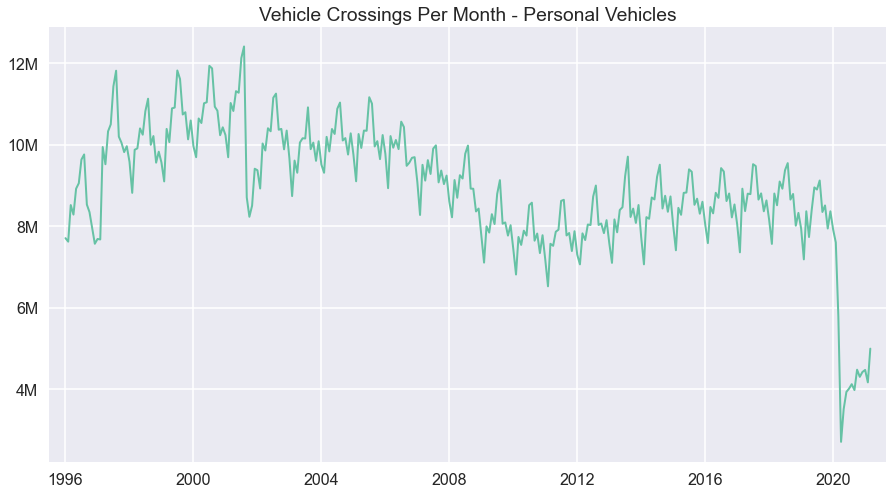

In [320]:
# Personal vehicles only
fig, ax = plt.subplots()
g = sns.lineplot(data=all_vehicles[all_vehicles['Measure']=='Personal Vehicles'], x='Date', y='Value', hue='Measure', linewidth=2, ax=ax)
ylabels = ['{:.0f}'.format(y) + 'M' for y in g.get_yticks()/1000000]
ax.set_yticklabels(ylabels)
ax.set_ylabel("", fontsize=14)
ax.set_xlabel("", fontsize=14)
ax.set_title("Vehicle Crossings Per Month - Personal Vehicles")
ax.margins(x=.02)
ax.get_legend().remove();

There is a seasonality trend, with crossings highest in the summer and lowest in the winter each year. We can also see a huge dropoff in early 2020!

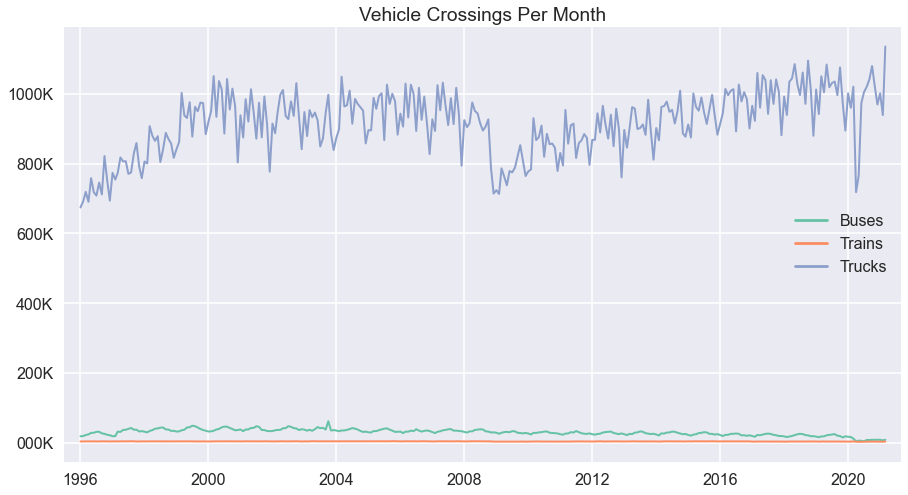

In [321]:
fig, ax = plt.subplots()
g = sns.lineplot(data=all_vehicles[all_vehicles['Measure']!='Personal Vehicles'], x='Date', y='Value', hue='Measure', linewidth=2, ax=ax)
ylabels = ['{:.0f}'.format(y) + '00K' for y in g.get_yticks()/100000]
ax.set_yticklabels(ylabels)
ax.set_ylabel("", fontsize=14)
ax.set_xlabel("", fontsize=14)
ax.margins(x=.02)
ax.set_title("Vehicle Crossings Per Month")
ax.legend(title='', loc = 7);

With truck traffic, we see a drop in 2009 (perhaps associated with the recession), and a steep drop in early 2020 followed by a quick return to previous levels. Truck traffic was actually at its highest ever in the past 25 years in March 2021!

We can do the same for passenger data:

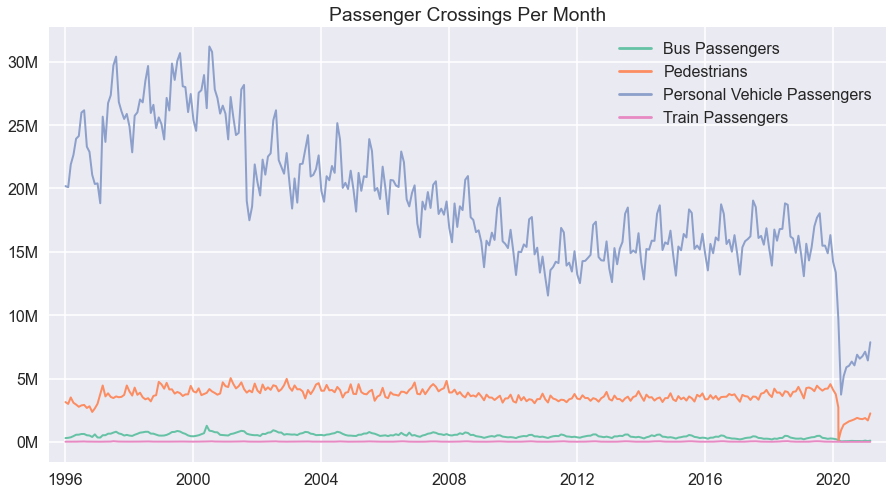

In [322]:
# Aggregate data by passenger type and date
all_vehicles = border[border['Measure'].isin(PERSON_COUNTS)].groupby(['Measure', 'Date'], as_index=False)['Value'].sum()

# Plot 
fig, ax = plt.subplots()
g = sns.lineplot(data=all_vehicles, x='Date', y='Value', hue='Measure', linewidth=2, ax=ax)
ylabels = ['{:.0f}'.format(y) + 'M' for y in g.get_yticks()/1000000]
ax.set_yticklabels(ylabels)
ax.set_ylabel("", fontsize=14)
ax.set_xlabel("")
ax.set_title("Passenger Crossings Per Month")
ax.margins(x=.02)
ax.legend(title='');

Personal vehicle passengers trended down from 2000-2010, and had been relatively stable until early 2020. There is a clear seasonal pattern to personal vehicle passengers. We can also see a large dropoff in pedestrian crossings since the start of the pandemic.

## What are the most popular ports of entry?

We will look at the past 10 years of data to determine the average monthly passenger and vehicle crossings for each port.

Let's start by analyzing passenger data:

In [323]:
# Filter data for past 10 years
border_10 = border[border['Date'] >= '2011-04-01']

In [324]:
# This time spans 121 months
border_10['Date'].nunique()

121

In [325]:
# Find average number of person crossings for each port
all_person_crossings = border_10[border_10['Measure'].isin(PERSON_COUNTS)]\
.groupby(['Port Name', 'Port Code', 'State'], as_index=False)['Value'].sum()
all_person_crossings['Value'] = all_person_crossings['Value'] / 121
all_person_crossings.sample(3)

,Port Name,Port Code,State,Value
86,Rio Grande City,2307,Texas,64977.173554
5,Andrade,2502,California,142071.404959
82,Presidio,2403,Texas,117426.710744


In [326]:
# Merge with geodata and convert to GeoDataFrame
all_person_crossings_merged = all_person_crossings.\
merge(ports[['portcode', 'geometry']], left_on='Port Code', right_on='portcode', how='inner')\
.drop_duplicates('Port Code', keep='first').drop('portcode', 1)
all_person_crossings_merged = geopandas.GeoDataFrame(all_person_crossings_merged)
all_person_crossings_merged.rename(columns={'Port Name':'Port_Name'}, inplace=True)
all_person_crossings_merged.sample(3)

,Port_Name,Port Code,State,Value,geometry
97,Madawaska,109,Maine,47059.371901,POINT (-7606314.402 5969595.686)
143,Sault Sainte Marie,3803,Michigan,112460.247934,POINT (-9390992.926 5831191.890)
61,Friday Harbor,3014,Washington,490.892562,POINT (-13693852.354 6164393.249)


In [337]:
# Create hover tool
hover = HoverTool(
    tooltips=[
        ("Port Name", "@Port_Name"),
         ("Crossings", "@Value{,f}")
    ])

# Scale marker size
markersize=all_person_crossings_merged['Value']/500

# Format US map
usbase = usa.hvplot(color='silver', line_color='white', 
                    xlim=(xmin-100000, xmax+100000), 
                    ylim=(ymin-100000, ymax+100000), 
                    width=950, height=550) 

# Format data
layer = all_person_crossings_merged.hvplot(c='Value', cmap='YlOrRd', 
                                           xaxis=None, yaxis=None, marker='o', 
                                           tools=[hover], hover_cols='Port_Name', 
                                           size=markersize, alpha=.8, line_color='black', 
                                           title = "Average Monthly Passenger Entries by Port, 2011-2021", 
                                           colorbar=False)

# Plot it!
usbase * layer

:Overlay
   .Polygons.I :Polygons   [x,y]
   .Points.I   :Points   [x,y]   (Value,_size,Port_Name)

With the exeption of Blaine, WA and Buffalo-Niagra Falls, the most popular border crossings are on the US-Mexico border.

In [328]:
# Top 10 passenger border crossings:
top_10 = all_person_crossings_merged.sort_values('Value', ascending=False)[['Port_Name', 'State', 'Value']].head(10)
top_10.index = np.arange(1, len(top_10) + 1)
top_10['Value'] = top_10['Value'].apply(lambda x: "{:,}".format(int(x)))
print(f'Top 10 border crossings for passengers, 2011-2021 monthly averages:')
top_10

Top 10 border crossings for passengers, 2011-2021 monthly averages:


,Port_Name,State,Value
1,San Ysidro,California,"2,535,152"
2,El Paso,Texas,"2,014,091"
3,Otay Mesa,California,"1,187,771"
4,Laredo,Texas,"1,125,533"
5,Calexico,California,"955,823"
6,Hidalgo,Texas,"911,192"
7,Buffalo Niagara Falls,New York,"907,770"
8,Brownsville,Texas,"898,389"
9,Nogales,Arizona,"786,677"
10,Blaine,Washington,"656,166"


We can compare this to the most popular ports for truck crossings:

In [329]:
# Find average number of truck crossings for each port
all_truck_crossings = border_10[border_10['Measure']=='Trucks']\
.groupby(['Port Name', 'Port Code', 'State'], as_index=False)['Value'].mean()
all_truck_crossings.sample(3)

,Port Name,Port Code,State,Value
88,San Ysidro,2504,California,0.000000
38,Frontier,3020,Washington,1730.791667
24,Del Rio,2302,Texas,5909.625000


In [330]:
# Merge with geodata and convert to GeoDataFrame
all_truck_crossings_merged = all_truck_crossings.\
merge(ports[['portcode', 'geometry']], left_on='Port Code', right_on='portcode', how='inner')\
.drop_duplicates('Port Code', keep='first').drop('portcode', 1)
all_truck_crossings_merged = geopandas.GeoDataFrame(all_truck_crossings_merged)
all_truck_crossings_merged.rename(columns={'Port Name':'Port_Name'}, inplace=True)
all_truck_crossings_merged.sample(3)

,Port_Name,Port Code,State,Value,geometry
110,Ogdensburg,701,New York,3147.058333,POINT (-8399918.326 5549515.245)
25,Calexico,2503,California,0.000000,POINT (-12856971.435 3827846.513)
66,Hidalgo,2305,Texas,47867.841667,POINT (-10939487.930 2992066.714)


In [331]:
# Create hover tool
hover = HoverTool(
    tooltips=[
        ("Port Name", "@Port_Name"),
         ("Crossings", "@Value{,f}")
    ])

# Scale marker size
markersize=all_truck_crossings_merged['Value']/30

# Format US map
usbase = usa.hvplot(color='silver', line_color='white', 
                    xlim=(xmin-100000, xmax+100000), 
                    ylim=(ymin-100000, ymax+100000), 
                    width=950, height=550) 

# Format data
layer = all_truck_crossings_merged.hvplot(c='Value', cmap='YlOrRd', 
                                           xaxis=None, yaxis=None, marker='o', 
                                           tools=[hover], hover_cols='Port_Name', 
                                           size=markersize, alpha=.8, line_color='black', 
                                           title = "Average Monthly Truck Crossings by Port, 2011-2021", 
                                           colorbar=False)

# Plot it!
usbase * layer

:Overlay
   .Polygons.I :Polygons   [x,y]
   .Points.I   :Points   [x,y]   (Value,_size,Port_Name)

In [332]:
# Top 10 truck border crossings:
top_10_truck = all_truck_crossings_merged.sort_values('Value', ascending=False)[['Port_Name', 'State', 'Value']].head(10)
top_10_truck.index = np.arange(1, len(top_10) + 1)
top_10_truck['Value'] = top_10_truck['Value'].apply(lambda x: "{:,}".format(int(x)))
print(f'Top 10 border crossings for trucks, 2011-2021 monthly averages:')
top_10_truck

Top 10 border crossings for trucks, 2011-2021 monthly averages:


,Port_Name,State,Value
1,Laredo,Texas,"172,988"
2,Detroit,Michigan,"127,358"
3,Buffalo Niagara Falls,New York,"77,532"
4,Otay Mesa,California,"72,207"
5,Port Huron,Michigan,"64,511"
6,El Paso,Texas,"58,093"
7,Hidalgo,Texas,"47,867"
8,Blaine,Washington,"30,073"
9,Calexico East,California,"29,338"
10,Nogales,Arizona,"27,269"


Popular truck crossings are more evenly split between the US-Canada border and US-Mexico border, as compared with passenger crossings. Laredo, Buffalo Niagra Falls, El Paso, Otay Mesa, Hidalgo, Nogales, and Blaine are in the top 10 for both passengers and trucks. San Ysidro, the most popular crossing point for passengers, no longer takes truck traffic - instead, truck crossings go to the nearby Otay Mesa crossing.

## US-Canada vs. US-Mexico Crossings

Do trends for the US-Canada and US-Mexico ports look similar? How has traffic changed on each border in 2020?

Let's look first at passenger crossings:

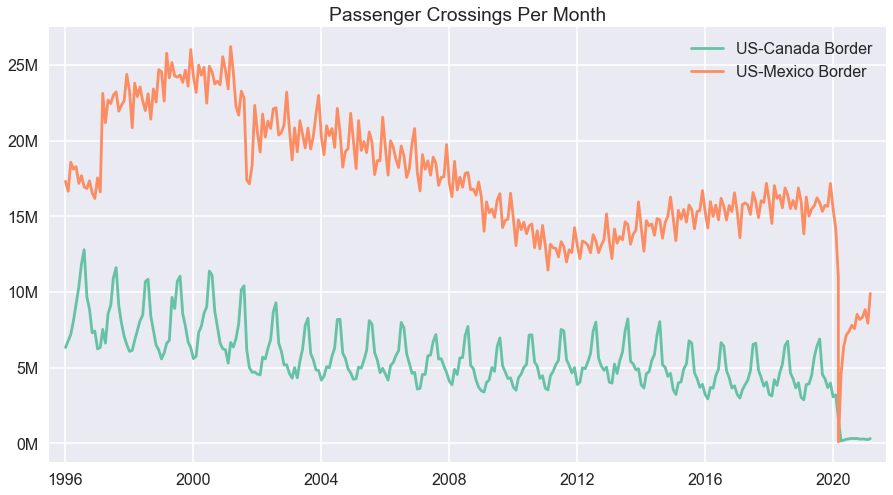

In [333]:
# Aggregate total passengers per month at each border
border_passengers = border[border['Measure'].isin(PERSON_COUNTS)].groupby(['Border', 'Date'], as_index=False)['Value'].sum()

# Plot
fig, ax = plt.subplots()
g = sns.lineplot(data=border_passengers, x='Date', y='Value', hue='Border')
ylabels = ['{:.0f}'.format(y) + 'M' for y in g.get_yticks()/1000000]
ax.set_yticklabels(ylabels)
ax.set_ylabel("", fontsize=14)
ax.set_xlabel("")
ax.set_title("Passenger Crossings Per Month")
ax.margins(x=.02)
ax.legend(title='');

US-Canada passenger crossings follow a clear annual seasonal trend. Land crossings at both borders have trended downwards since the late 1990s - it would be interesting to compare this with flight data to see if more passengers are now flying instead, or if the overall traffic has dropped. We see a large drop in early 2020 for both borders. US-Mexico passenger traffic immediately increased again (although not to previous levels), while US-Canada traffic has remained extremely limited - US-Canada land border crossings have been limited to essential crossings since March 21, 2020.

We can get a clearer view of this recent data below:

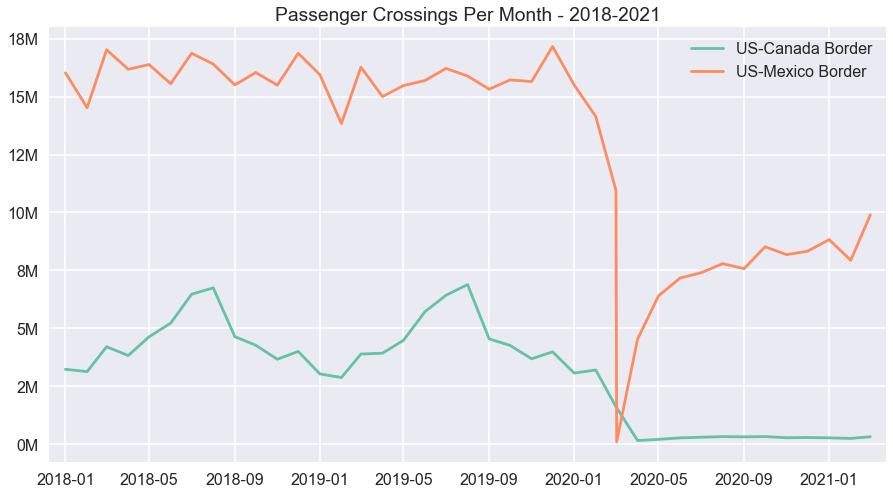

In [334]:
# Plot
fig, ax = plt.subplots()
g = sns.lineplot(data=border_passengers[border_passengers['Date'] >= '2018'], x='Date', y='Value', hue='Border')
ylabels = ['{:.0f}'.format(y) + 'M' for y in g.get_yticks()/1000000]
ax.set_yticklabels(ylabels)
ax.set_ylabel("", fontsize=14)
ax.set_xlabel("")
ax.set_title("Passenger Crossings Per Month - 2018-2021")
ax.margins(x=.02)
ax.legend(title='');

Next, we'll look at truck crossings:

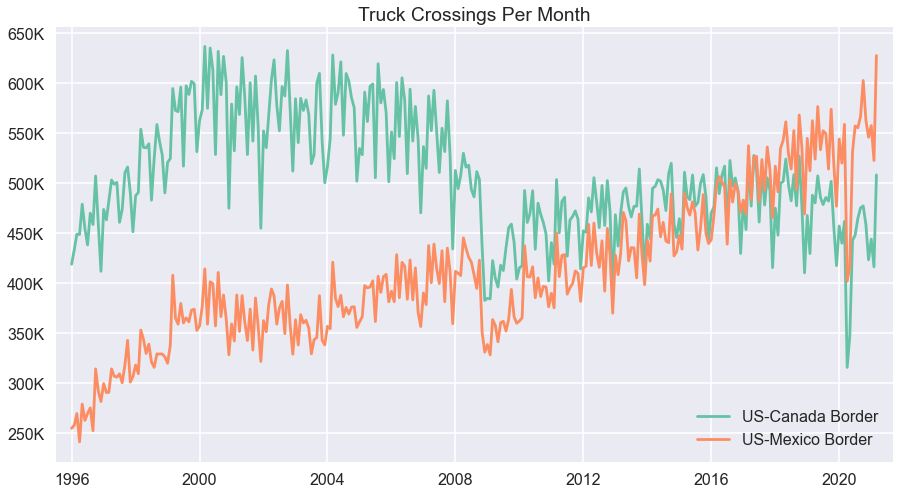

In [335]:
# Aggregate total trucks per month at each border
border_trucks = border[border['Measure']=="Trucks"].groupby(['Border', 'Date'], as_index=False)['Value'].sum()

# Plot
fig, ax = plt.subplots()
g = sns.lineplot(data=border_trucks, x='Date', y='Value', hue='Border')
ylabels = ['{:.0f}'.format(y) + 'K' for y in g.get_yticks()/1000]
ax.set_yticklabels(ylabels)
ax.set_ylabel("", fontsize=14)
ax.set_xlabel("")
ax.set_title("Truck Crossings Per Month")
ax.margins(x=.02)
ax.legend(title='');

More trucks entered the US from Canada in the late 1990s and 2000s. By 2016, truck traffic from Mexico has surpassed truck traffic from Canada. Trucks entering the US from Mexico have been trending upwards since the start of the data (1996), and have more than doubled over the past 25 years.

Let's take a closer look at recent truck crossing data:

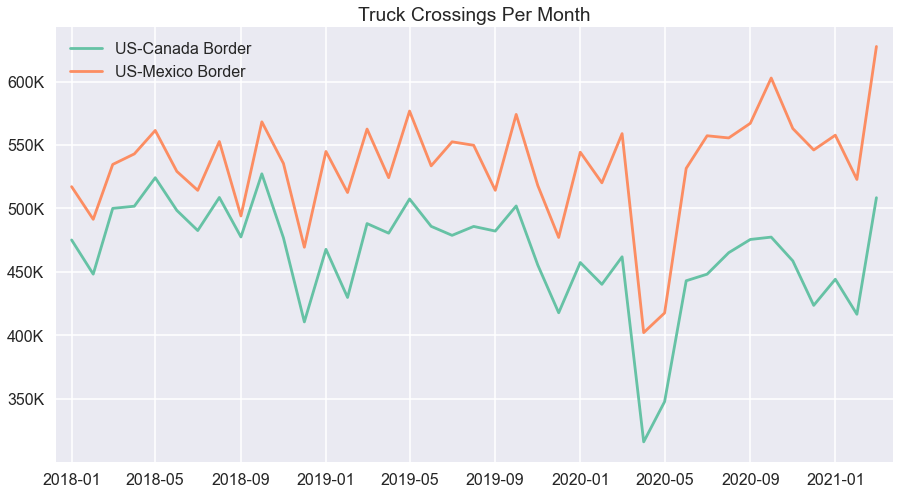

In [336]:
# Plot
fig, ax = plt.subplots()
g = sns.lineplot(data=border_trucks[border_trucks['Date'] >= '2018'], x='Date', y='Value', hue='Border')
ylabels = ['{:.0f}'.format(y) + 'K' for y in g.get_yticks()/1000]
ax.set_yticklabels(ylabels)
ax.set_ylabel("", fontsize=14)
ax.set_xlabel("")
ax.set_title("Truck Crossings Per Month")
ax.margins(x=.02)
ax.legend(title='');

The monthly pattern of US-Mexico vs. US-Canada truck crossings is strikingly similar for the past 3 years! We can also observe a temporary dip and rapid rebound in truck crossings in early 2020 - in fact, the latest truck crossings from spring 2021 are the highest in the past 25 years of data. In contrast to US-Canada passenger traffic, US-Canada truck traffic is similar to pre-pandemic levels. 

## Conclusion

This project was a fun opportunity to explore working with geodata and interactive visualizations in Python. I found geopandas very straightforward to work with, and appreciate the clear documentation. The US Bureau of Transportation Statistics https://www.bts.gov/ has a lot of interesting and accessible data available for analysis.